# Imports

In [1]:
import scanpy as sc

import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.style as style
import matplotlib

import plotly.figure_factory as ff
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

# utils function -- helper functions for plotting
import sys
sys.path.append('../../utils/')
import figure_utils as figure_utils

In [2]:
# create figures directory
import os

directory_path = 'figures'
if not os.path.exists(directory_path):
    # If not, create the directory
    os.makedirs(directory_path)
    print(f"Directory '{directory_path}' created successfully.")
else:
    print(f"Directory '{directory_path}' already exists.")

Directory 'figures' created successfully.


# Plot aesthetics

In [3]:
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 500 # 150 dpi resolution
matplotlib.rcParams['image.cmap'] = 'Spectral_r' # preferred color map
# matplotlib.rcParams['figure.figsize'] = [6, 6] # Square
# no bounding boxes or axis:
matplotlib.rcParams['axes.spines.bottom'] = "off"
matplotlib.rcParams['axes.spines.top'] = "off"
matplotlib.rcParams['axes.spines.left'] = "off"
matplotlib.rcParams['axes.spines.right'] = "off"

In [4]:
# UMAP PARAMS
DOT_SIZE = 25
LEGEND_FONTSIZE = 8
LEGEND_FONTOUTLINE = 1
UMAP_FIGSIZE = (10,10)

# SEXES COLOR
# HERM_COLOR = '#f58020'
# MALE_COLOR = '#1479b8'
# SHARED_SEX_COLOR = '#c2b69b'

# SEXES COLOR -- NEW
HERM_COLOR = '#ff8b00'
MALE_COLOR = '#2258a5'
SHARED_SEX_COLOR = '#349c55'

# SHEATH/SOCKET COLORS
# SHEATH_COLOR = '#a5444b'
# SOCKET_COLOR = '#bfbaba'

# DEAFULT teal brown
# SHEATH_COLOR = '#008080'
# SOCKET_COLOR = '#8B4513'

# lighter teal -- EQ
SHEATH_COLOR = '#3ac9c9' # '#369e9e'
SOCKET_COLOR = '#c47841'

# teal magenta

# lighter teal brown
# SHEATH_COLOR = '#00CED1'
# SOCKET_COLOR = '#D2691E'

# HEATMAP COLOR AESTHETICS
PLOTLY_COLOR_TEMPLATE = 'plotly_white'
HEATMAP_COLOR = [[0,'rgb(250,250,250)'], [1,'rgb(102,0,204)']]
HEATMAP_MIN_COLOR = 0
HEATMAP_MAX_COLOR = 4

# Load Data

In [5]:
adata = sc.read('../../data/WholeData.h5ad')
adata_glia = sc.read('../../data/GliaOnly.h5ad')

# SFig 7A -- <i>flp, ins, nlp</i> Neuropeptide Expression

In [6]:
gene_sets_nps = figure_utils.filter_gene_expression(ad_data=adata_glia, cluster_labels='Cluster_Celltype',
                                      target_genes='neuropeptides', percent_group_threshold=0.4)

Getting Fractions: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 123/123 [00:06<00:00, 17.85it/s]


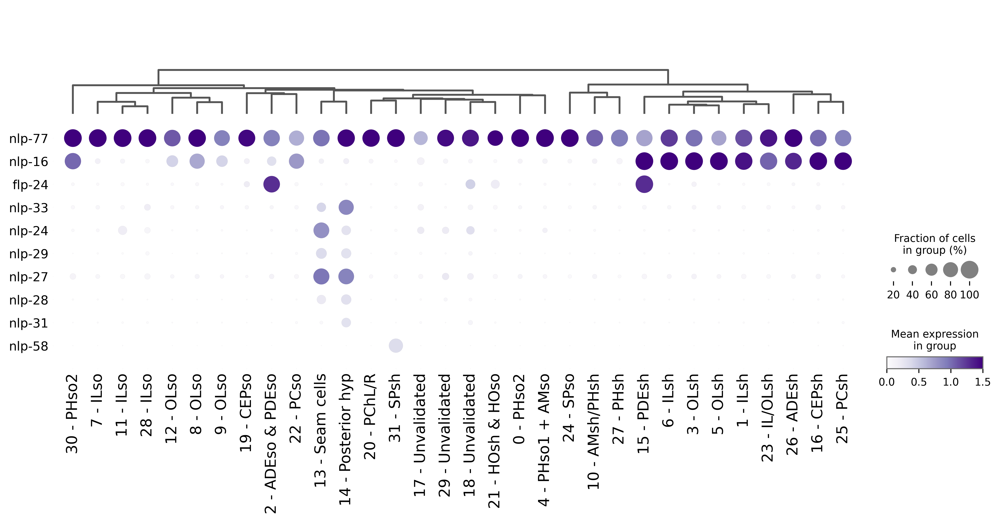

In [7]:
# transcription factor dotplots
with matplotlib.pyplot.rc_context({'axes.edgecolor':'dimgray', 'xtick.color':'black', 'ytick.color':'black', 'figure.facecolor':'white'}):
    dotplot_tf = sc.pl.dotplot(adata_glia, var_names=gene_sets_nps, groupby='Cluster_Celltype', cmap='Purples', return_fig=True, dendrogram=True, swap_axes=True, vmax=1.5)
    dotplot_tf.dot_edge_lw = 0.01
    
    # fix aesthetics
    dotplot_tf.get_axes()['mainplot_ax'].axes.tick_params(axis='both', which='both', length=0.01)
    
    # axis fonts/colors
    xticks = dotplot_tf.get_axes()['mainplot_ax'].axes.get_xticklabels()
    yticks = dotplot_tf.get_axes()['mainplot_ax'].axes.get_yticklabels()
    
    for tick in xticks:
        tick.set_fontsize(12)
        # tick.set_color
    
    for tick in yticks:
        tick.set_fontsize(10)
    
    plt.savefig('figures/S7A_NeuroPeptides_Dotplot.png', bbox_inches='tight')

# SFig 7B -- <i>kpc-1</i> Expression

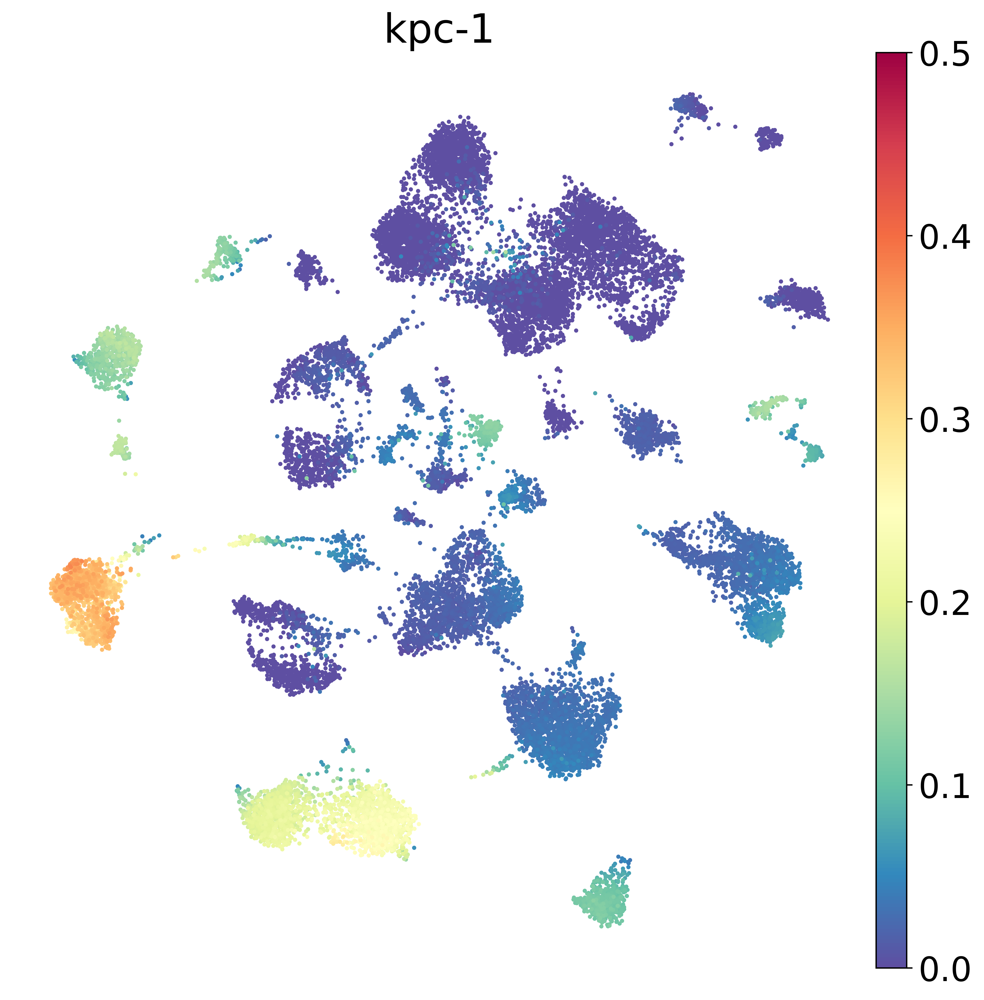

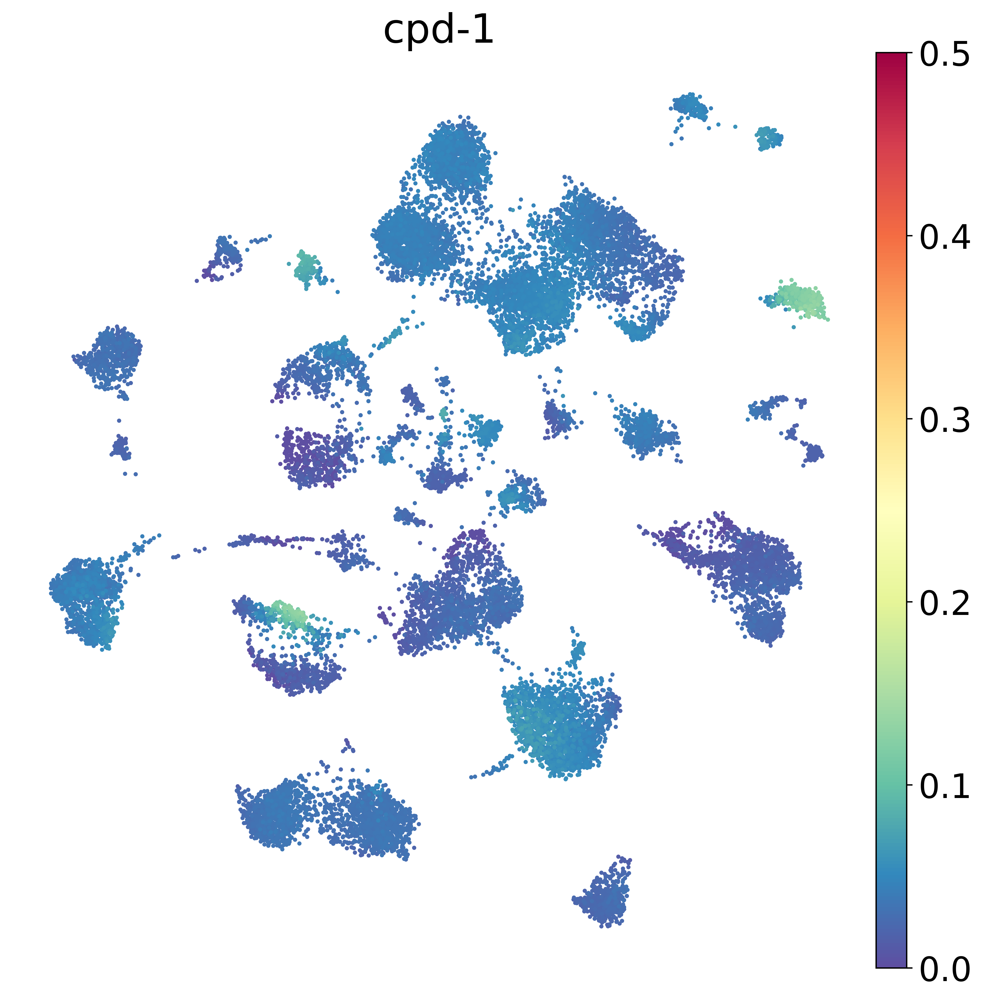

In [8]:
with matplotlib.pyplot.rc_context({'figure.figsize':UMAP_FIGSIZE, 'font.size': 20.0}):
    PLOT_GENES = ['kpc-1','cpd-1'] 
    for gene in PLOT_GENES:
        sc.pl.umap(
            adata_glia,
            color=[gene],
            frameon=False,
            size=DOT_SIZE,
            save=f'figure_S7B_{gene}.png',
            layer='magic_imputed_postBC',
            vmin=0,
            vmax=0.5
        )

# SFig 7C -- <i>cpd-1, pamn-1, pghm-1 & pgal-1</i> Expression

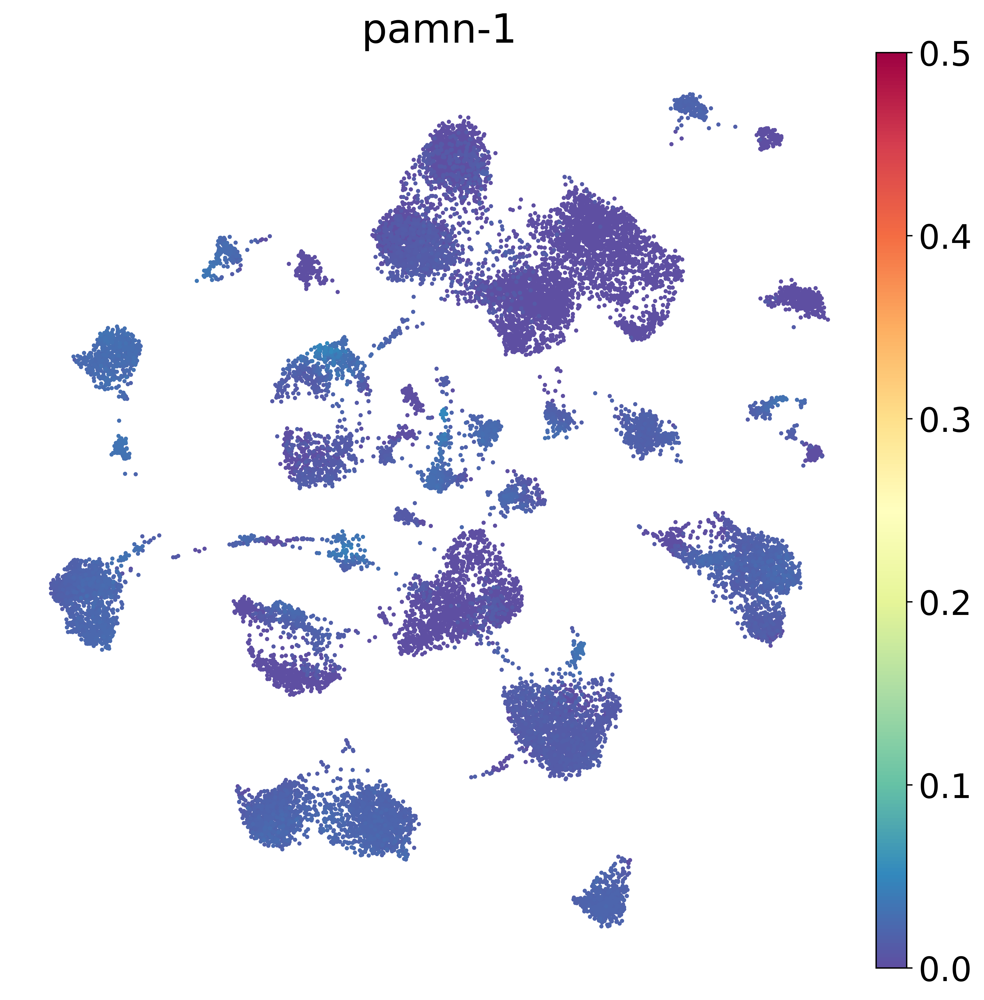

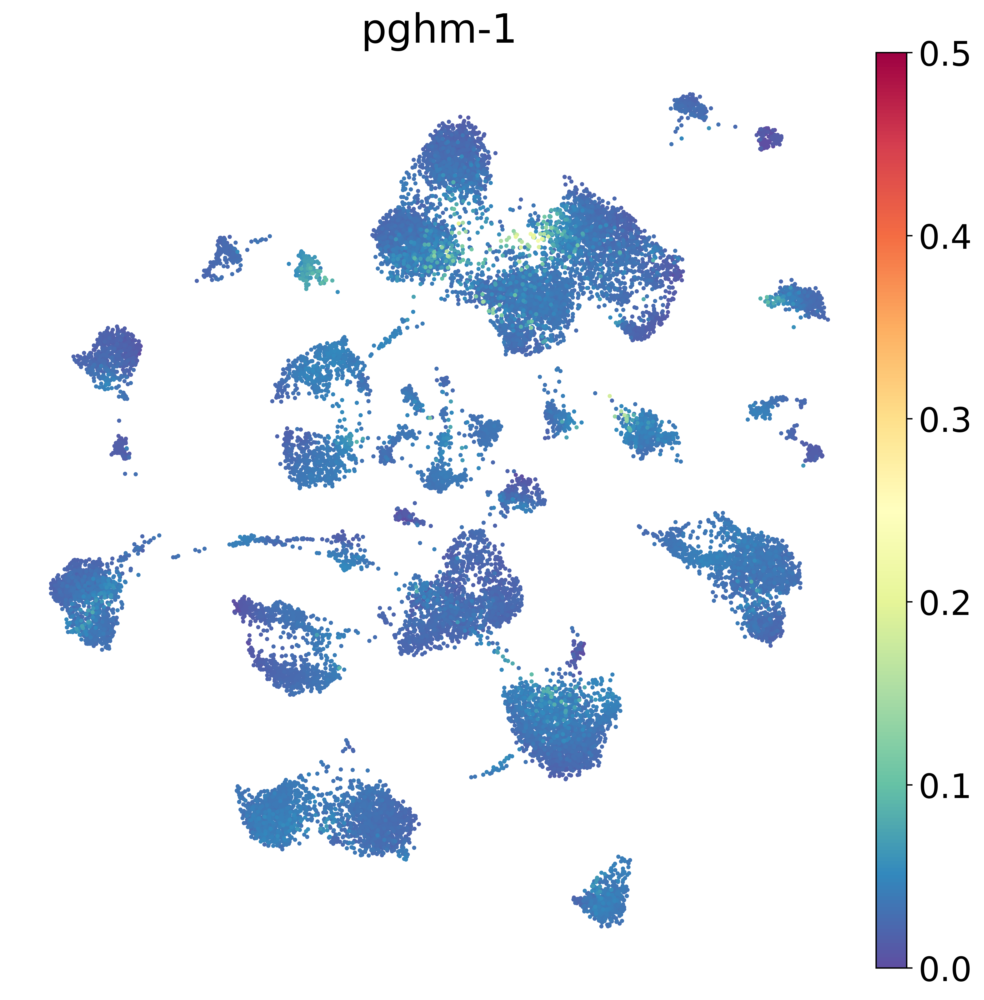

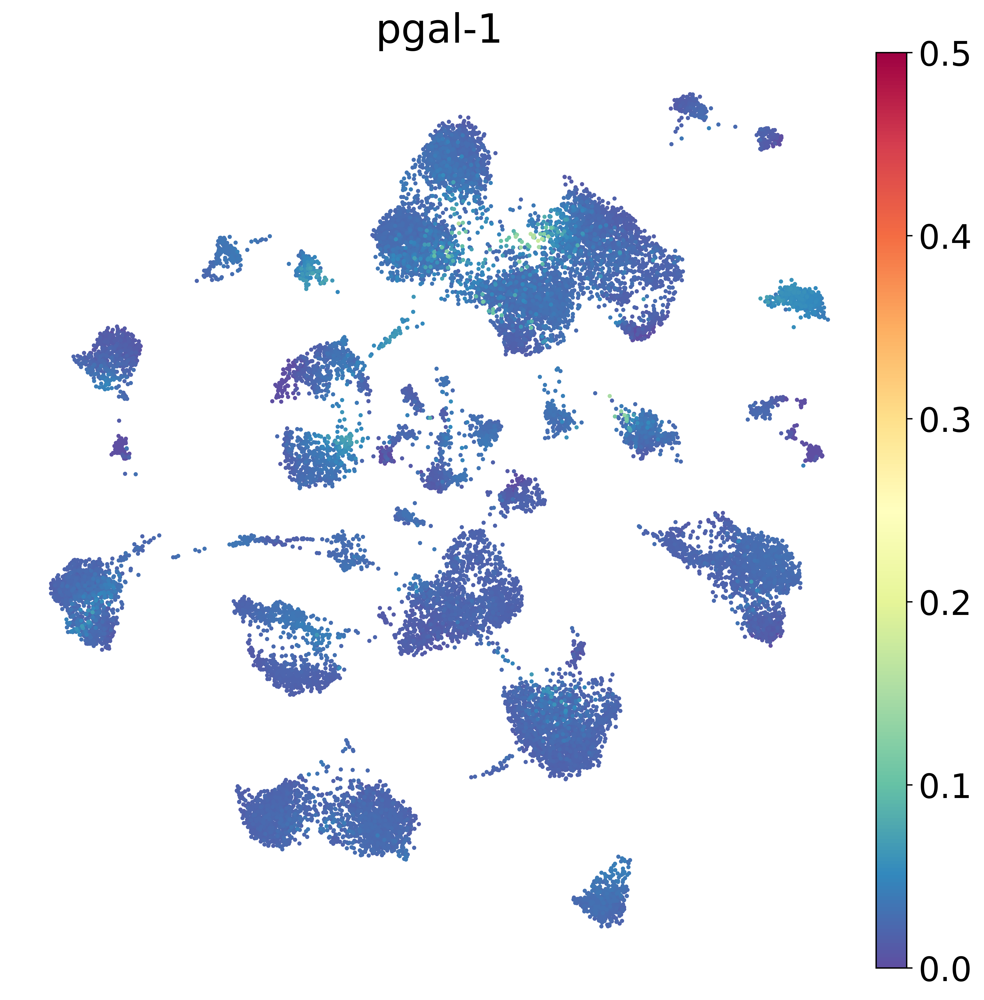

In [9]:
with matplotlib.pyplot.rc_context({'figure.figsize':UMAP_FIGSIZE, 'font.size': 20.0}):
    PLOT_GENES = ['pamn-1','pghm-1','pgal-1'] 
    for gene in PLOT_GENES:
        sc.pl.umap(
            adata_glia,
            color=[gene],
            frameon=False,
            size=DOT_SIZE,
            save=f'figure_S7C_{gene}.png',
            layer='magic_imputed_postBC',
            vmin=0,
            vmax=0.5
        )

# SFig 7D -- <i>tpp-2, dpf-1, dpf-2 & acn-1</i> Expression

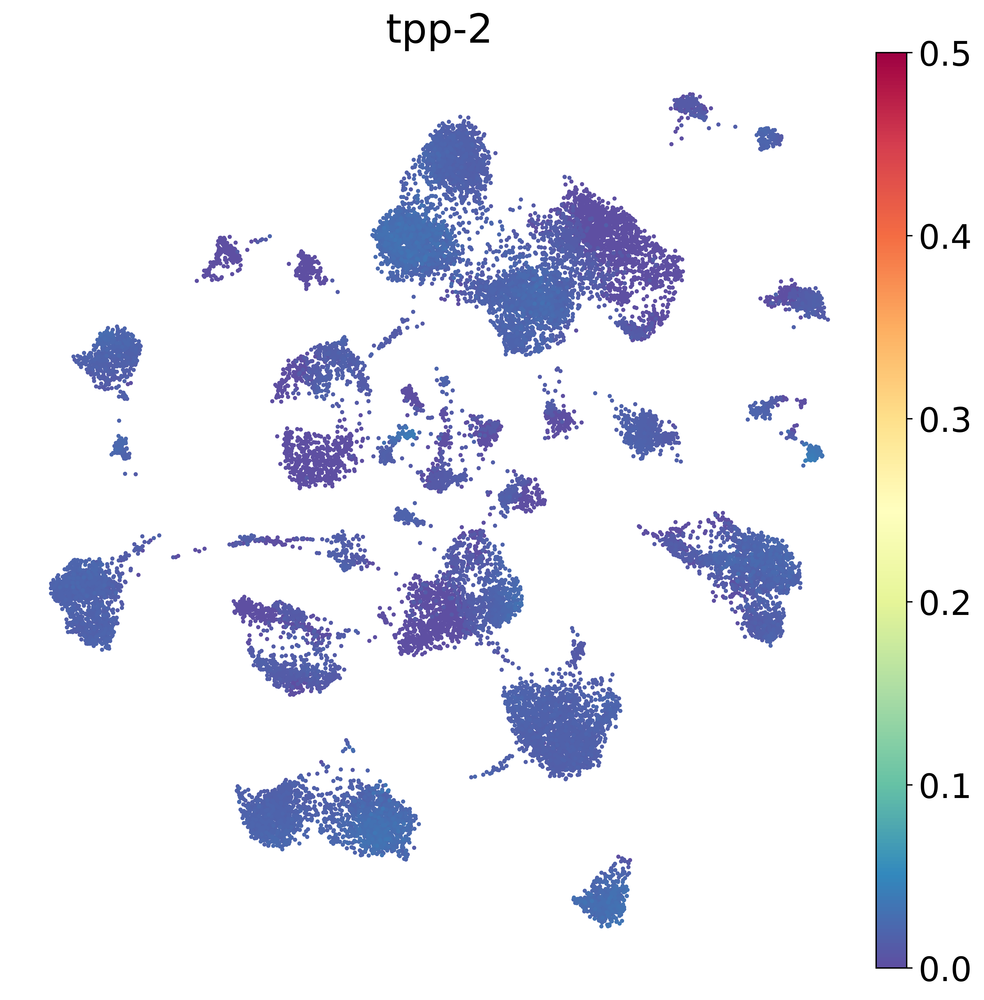

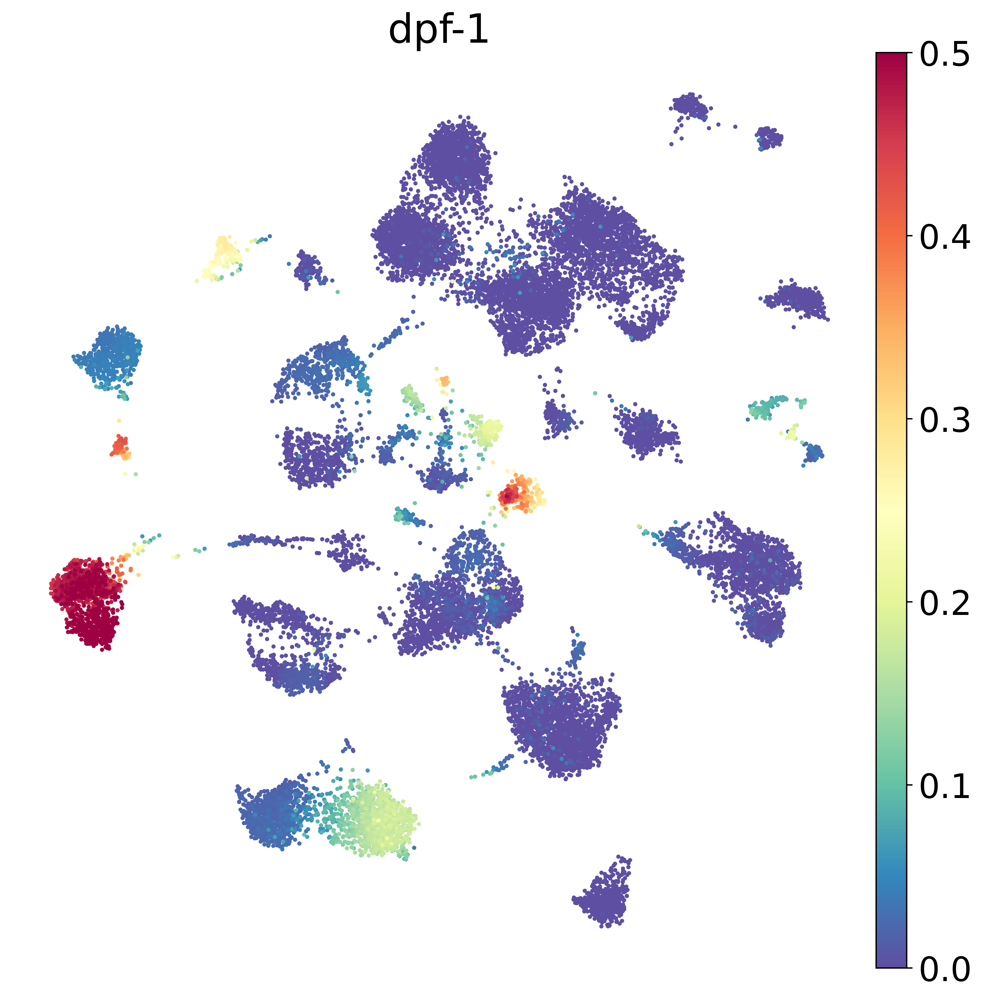

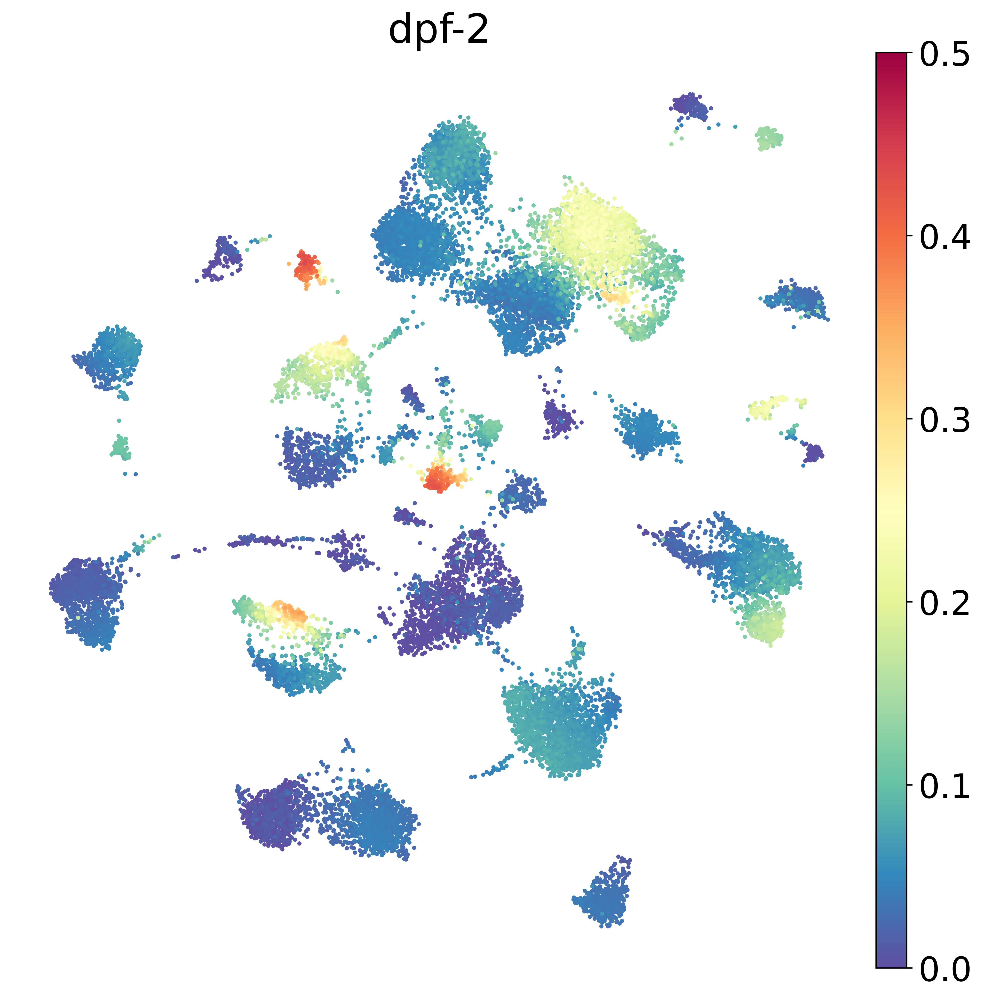

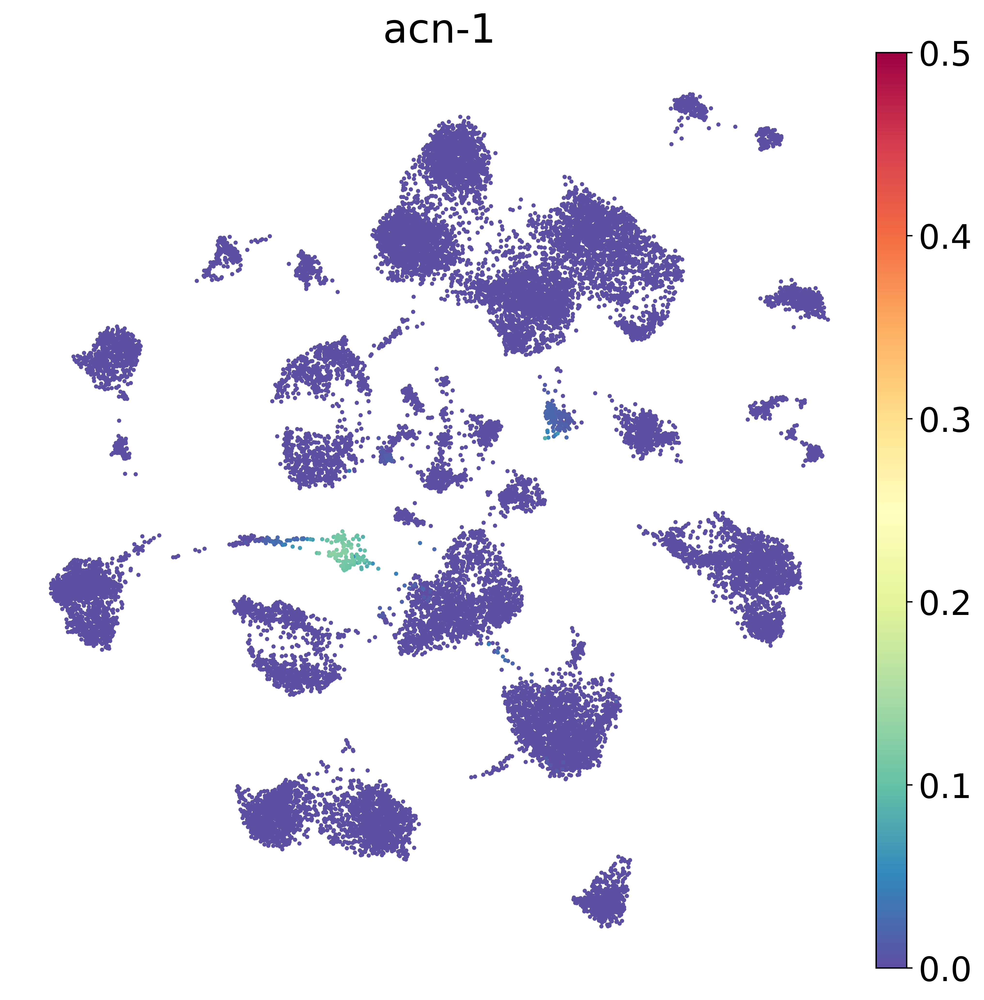

In [10]:
with matplotlib.pyplot.rc_context({'figure.figsize':UMAP_FIGSIZE, 'font.size': 20.0}):
    PLOT_GENES = ['tpp-2','dpf-1','dpf-2','acn-1'] 
    for gene in PLOT_GENES:
        sc.pl.umap(
            adata_glia,
            color=[gene],
            frameon=False,
            size=DOT_SIZE,
            save=f'figure_S7D_{gene}.png',
            layer='magic_imputed_postBC',
            vmin=0,
            vmax=0.5
        )